# 6. Visualización Comparativa de Modelos

Este notebook tiene como objetivo comparar visualmente las predicciones de los tres modelos:
1.  **Acuatico-Nano (Especialista)**: Alta precisión.
2.  **Mixto-Large (Sabueso)**: Alto recall.
3.  **Ensemble (WBF)**: Equilibrio entre precisión y recall.

Se generará una visualización de 4 columnas para cada imagen del conjunto de prueba, mostrando la imagen original con las detecciones reales (Ground Truth) y las detecciones de cada modelo.

In [1]:
import os
import glob
import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from ensemble_boxes import weighted_boxes_fusion
from tqdm.notebook import tqdm

%matplotlib inline

In [2]:
# --- CONFIGURACIÓN---
PATH_NANO = 'modelos_entrenados/modelo-acuatico-n.pt'
PATH_LARGE = 'modelos_entrenados/modelo-acuatico-m.pt'
TEST_IMAGES_DIR = 'dataset_yolo/images/test'
TEST_LABELS_DIR = 'dataset_yolo/labels/test' # <--- AÑADIDO

# Parámetros del Ensemble (los mismos que en el notebook 5)
WEIGHTS = [1, 1] # [Nano, Medium]
IOU_THR = 0.45
SKIP_BOX_THR = 0.001
CONF_THR = 0.3 # Umbral de confianza para la predicción inicial


# Verificar rutas
print(f"Modelo Nano existe: {os.path.exists(PATH_NANO)}")
print(f"Modelo Large existe: {os.path.exists(PATH_LARGE)}")
print(f"Directorio de imágenes de test existe: {os.path.exists(TEST_IMAGES_DIR)}")
print(f"Directorio de etiquetas de test existe: {os.path.exists(TEST_LABELS_DIR)}")

Modelo Nano existe: True
Modelo Large existe: True
Directorio de imágenes de test existe: True
Directorio de etiquetas de test existe: True


In [3]:
# Cargar modelos
model_nano = YOLO(PATH_NANO)
model_large = YOLO(PATH_LARGE)

## 2. Funciones de Ayuda (Ensemble y Dibujo)

In [4]:
def prepare_boxes(results):
    """Extrae cajas normalizadas de resultados YOLO."""
    boxes_list = []
    scores_list = []
    labels_list = []
    for result in results:
        boxes = result.boxes.xyxyn.cpu().numpy()
        scores = result.boxes.conf.cpu().numpy()
        labels = result.boxes.cls.cpu().numpy()
        boxes_list.append(boxes)
        scores_list.append(scores)
        labels_list.append(labels)
    return boxes_list, scores_list, labels_list

def run_wbf(preds_nano, preds_large, weights, iou_thr, skip_thr):
    """Combina predicciones usando Weighted Boxes Fusion (WBF)."""
    b1, s1, l1 = prepare_boxes(preds_nano)
    b2, s2, l2 = prepare_boxes(preds_large)
    
    boxes_list = [b1[0], b2[0]]
    scores_list = [s1[0], s2[0]]
    labels_list = [l1[0], l2[0]]

    boxes, scores, labels = weighted_boxes_fusion(
        boxes_list, scores_list, labels_list,
        weights=weights, iou_thr=iou_thr, skip_box_thr=skip_thr
    )
    return boxes, scores, labels

def draw_boxes(image, boxes, scores=None, color=(0, 255, 0), show_scores=True):
    """Dibuja bounding boxes en una imagen (modificado para ser genérico)."""
    img_res = image.copy()
    h, w, _ = img_res.shape
    
    for i, box in enumerate(boxes):
        x1, y1, x2, y2 = box
        # Coordenadas a píxeles
        x1, y1, x2, y2 = int(x1 * w), int(y1 * h), int(x2 * w), int(y2 * h)
        
        # Dibujar rectangulo
        cv2.rectangle(img_res, (x1, y1), (x2, y2), color, 2)
        
        # Añadir texto con el score si se proporciona
        if show_scores and scores is not None:
            label = f"{scores[i]:.2f}"
            (label_w, label_h), baseline = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 2)
            cv2.rectangle(img_res, (x1, y1 - label_h - baseline), (x1 + label_w, y1), color, -1) # Fondo
            cv2.putText(img_res, label, (x1, y1 - baseline), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0), 2) # Texto
            
    return img_res

## 3. Generación y Visualización de Resultados

Visualizando Resultados:   0%|          | 0/33 [00:00<?, ?it/s]

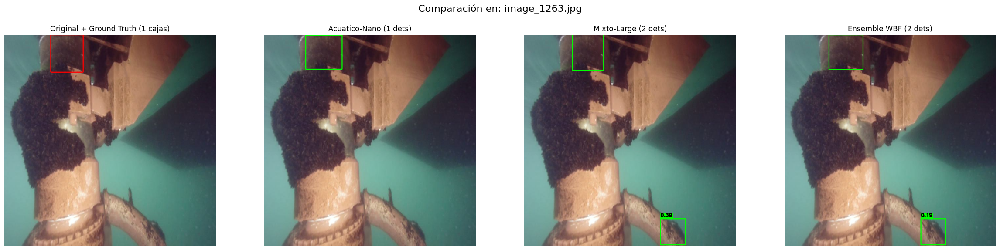

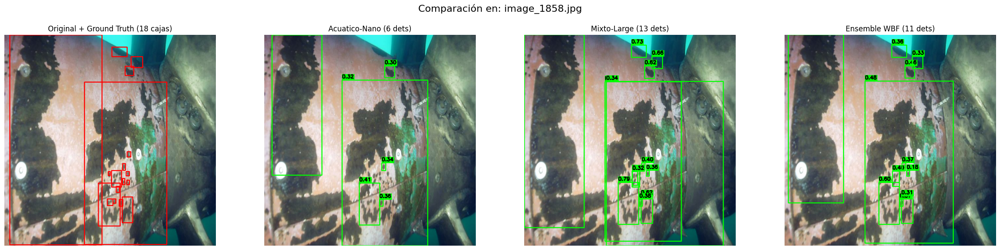

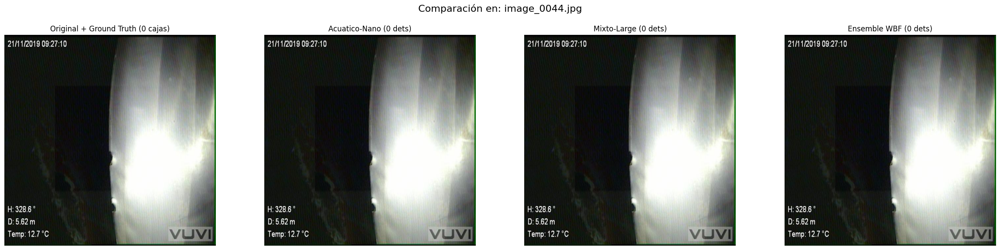

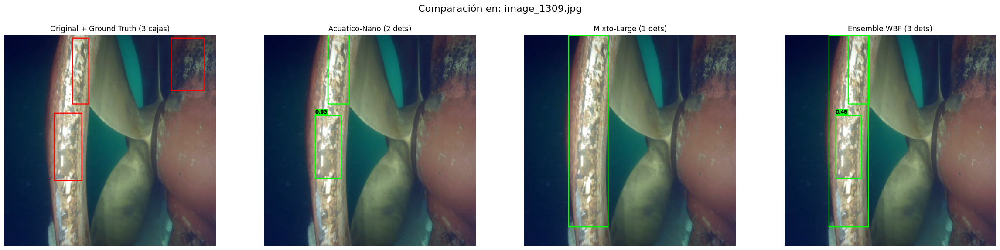

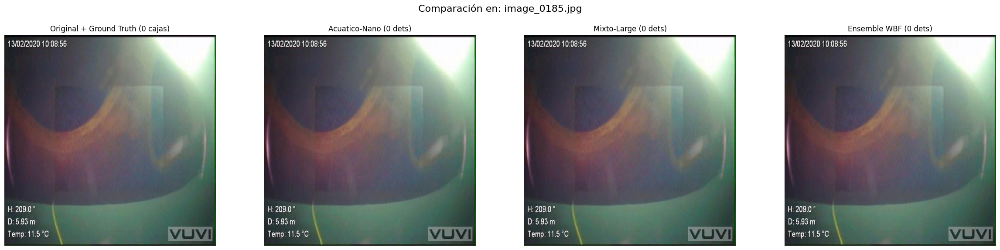

...

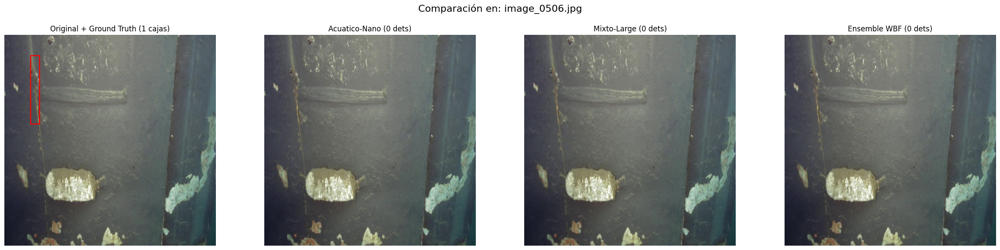

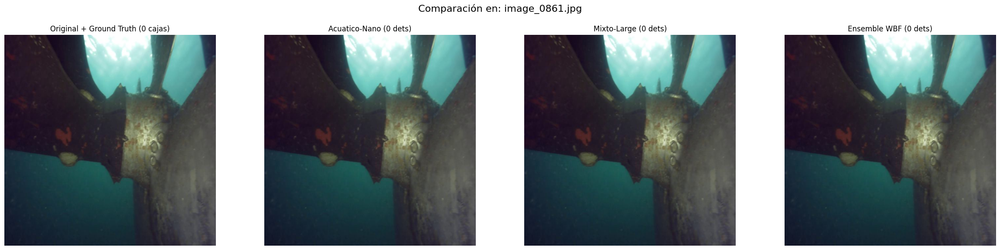

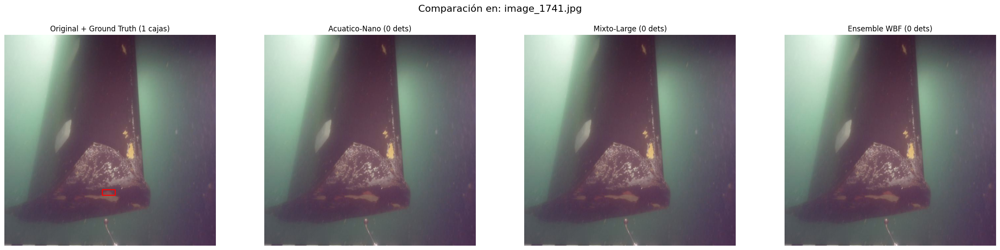

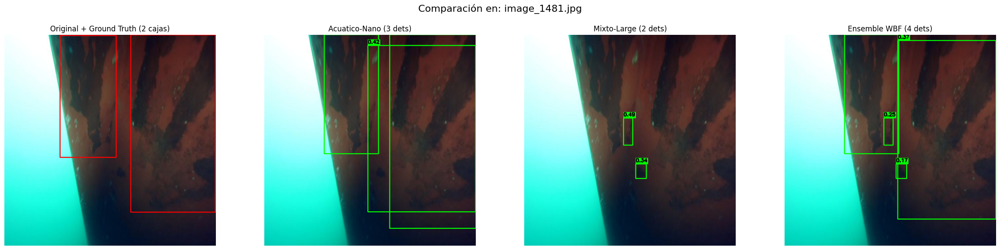

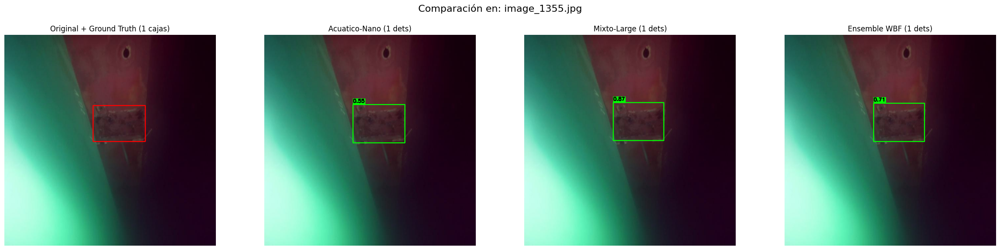

In [5]:
image_files = glob.glob(os.path.join(TEST_IMAGES_DIR, '*.jpg')) + glob.glob(os.path.join(TEST_IMAGES_DIR, '*.png'))

for img_path in tqdm(image_files, desc="Visualizando Resultados"):
    # Cargar la imagen original
    original_img = cv2.imread(img_path)
    original_img_rgb = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
    
    # --- 1. Cargar y dibujar Ground Truth (GT) ---
    label_name = os.path.basename(img_path).rsplit('.', 1)[0] + '.txt'
    label_path = os.path.join(TEST_LABELS_DIR, label_name)
    gt_boxes = []
    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            for line in f:
                parts = list(map(float, line.strip().split()))
                _, xc, yc, w, h = parts
                x1 = xc - w / 2
                y1 = yc - h / 2
                x2 = xc + w / 2
                y2 = yc + h / 2
                gt_boxes.append([x1, y1, x2, y2])
    img_gt = draw_boxes(original_img_rgb, gt_boxes, color=(255, 0, 0), show_scores=False)
    
    # --- 2. Inferencia y Dibujo de Modelos ---
    # Modelo Nano
    preds_nano = model_nano.predict(img_path, conf=CONF_THR, verbose=False)
    boxes_nano, scores_nano, _ = prepare_boxes(preds_nano)
    img_nano = draw_boxes(original_img_rgb, boxes_nano[0], scores_nano[0], color=(0, 255, 0))

    # Modelo Large
    preds_large = model_large.predict(img_path, conf=CONF_THR, verbose=False)
    boxes_large, scores_large, _ = prepare_boxes(preds_large)
    img_large = draw_boxes(original_img_rgb, boxes_large[0], scores_large[0], color=(0, 255, 0))
    
    # Ensemble WBF
    boxes_wbf, scores_wbf, _ = run_wbf(preds_nano, preds_large, WEIGHTS, IOU_THR, SKIP_BOX_THR)
    img_wbf = draw_boxes(original_img_rgb, boxes_wbf, scores_wbf, color=(0, 255, 0))
    
    # --- 4. Crear el plot ---
    fig, axes = plt.subplots(1, 4, figsize=(24, 6))
    fig.suptitle(f'Comparación en: {os.path.basename(img_path)}', fontsize=16)
    
    axes[0].imshow(img_gt)
    axes[0].set_title(f'Original + Ground Truth ({len(gt_boxes)} cajas)')
    axes[0].axis('off')
    
    axes[1].imshow(img_nano)
    axes[1].set_title(f'Acuatico-Nano ({len(boxes_nano[0])} dets)')
    axes[1].axis('off')
    
    axes[2].imshow(img_large)
    axes[2].set_title(f'Mixto-Large ({len(boxes_large[0])} dets)')
    axes[2].axis('off')
    
    axes[3].imshow(img_wbf)
    axes[3].set_title(f'Ensemble WBF ({len(boxes_wbf)} dets)')
    axes[3].axis('off')
    
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()
